## 1. Make Graph

Convert the `EPANET` model to a `networkx` graph

In [2]:
import os
import yaml
import time
import torch
import epynet
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from utils.epanet_loader import get_nx_graph
from utils.epanet_simulator import epanetSimulator
from utils.data_loader import battledimLoader, dataCleaner, dataGenerator, embedSignalOnGraph, rescaleSignal
from modules.torch_gnn import ChebNet
from utils.visualisation import visualise

# Runtime configuration
path_to_wdn     = './data/L-TOWN.inp'
path_to_data    = './data/l-town-data/'
weight_mode     = 'pipe_length'
self_loops      = True
scaling         = 'minmax'
figsize         = (50,16)
print_out_rate  = 1               
model_name      = 'l-town-chebnet-' + weight_mode +'-' + scaling + '{}'.format('-self_loop' if self_loops else '')
last_model_path = './studies/models/' + model_name + '-1.pt'
last_log_path   = './studies/logs/'   + model_name + '-1.csv' 

# Import the .inp file using the EPYNET library
wdn = epynet.Network(path_to_wdn)

# Solve hydraulic model for a single timestep
wdn.solve()

# Convert the file using a custom function, based on:
# https://github.com/BME-SmartLab/GraphConvWat 
G , pos , head = get_nx_graph(wdn, weight_mode=weight_mode, get_head=True)

## 6. Read in Yearly Prediction and Scale Back to Original Interval

In [7]:
def read_prediction(filename='predictions.csv', scale=1, bias=0, start_date='2018-01-01 00:00:00'):
    df = pd.read_csv(filename, index_col='Unnamed: 0')
    df.columns = ['n{}'.format(int(node)+1) for node in df.columns]
    df = df*scale+bias
    df.index = pd.date_range(start=start_date,
                             periods=len(df),
                             freq = '5min')
    return df

In [8]:
n_timesteps = 24                                             # Timesteps, t-1, t-2...t-n used to predict pressure at t
sample_rate = 5                                              # Minutes sampling rate of data
offset      = pd.DateOffset(minutes=sample_rate*n_timesteps) # We require n_timesteps of data our first prediction

Load predictions

In [9]:
p18 = read_prediction(filename='./studies/results/pred_pressure_2018.csv',
                      scale   = 1,
                      bias    = 0,
                      start_date=pd.Timestamp('2018-01-01 00:00:00') + offset)

Load reconstructions

In [10]:
r18 = read_prediction(filename='./studies/results/recon_pressure_2018.csv',
                      scale   = 1,
                      bias    = 0,
                      start_date='2018-01-01 00:00:00')

Load leakage dataset

In [11]:
l18 = pd.read_csv('data/l-town-data/2018_Leakages.csv',decimal=',',sep=';',index_col='Timestamp')
l18.index = r18.index # Fix the index column timestamp format

In [12]:
neighbors_by_pipe = {}

for node in G:
    for neighbor, connecting_edge in G[node].items():
        if connecting_edge['name'] == 'SELF':
            continue
        else:
            neighbors_by_pipe[connecting_edge['name']] = [node, neighbor]
            

Let's also create the inverse, when we want to look up pipes by their connecting nodes

In [13]:
pipe_by_neighbors = { str(neighbor_list) : pipe for pipe , neighbor_list in neighbors_by_pipe.items()}

We'll also create a function to perform the lookup, as the order in which the nodes appear in the key matter and we don't bother with raising endless errors when looking up nodes we know to be connected, just cause we input them wrong

In [14]:
def pipeByNeighborLookup(node1, node2, pipe_by_neighbors):
    try:
        return pipe_by_neighbors[str([node1,node2])]    # If we don't find the first combination
    except:
        try:                                            # We try the next
            return pipe_by_neighbors[str([node2,node1])]
        except:                                         # And if we still don't find it
            print('Nodes are not connected by a pipe')  # We exit with a graceful message


In [15]:
leak_timestamps = {}

for leak in l18:
    leak_timestamps[leak] = l18.index[l18[leak]>0]

In [23]:
leak_timestamps.keys()

dict_keys(['p31', 'p158', 'p183', 'p232', 'p257', 'p369', 'p427', 'p461', 'p538', 'p628', 'p654', 'p673', 'p810', 'p866'])

In [24]:
leak_timestamps['p673']

DatetimeIndex(['2018-03-05 15:45:00', '2018-03-05 15:50:00',
               '2018-03-05 15:55:00', '2018-03-05 16:00:00',
               '2018-03-05 16:05:00', '2018-03-05 16:10:00',
               '2018-03-05 16:15:00', '2018-03-05 16:20:00',
               '2018-03-05 16:25:00', '2018-03-05 16:30:00',
               ...
               '2018-03-23 09:40:00', '2018-03-23 09:45:00',
               '2018-03-23 09:50:00', '2018-03-23 09:55:00',
               '2018-03-23 10:00:00', '2018-03-23 10:05:00',
               '2018-03-23 10:10:00', '2018-03-23 10:15:00',
               '2018-03-23 10:20:00', '2018-03-23 10:25:00'],
              dtype='datetime64[ns]', length=5121, freq='5T')

These might really come in handy when it comes to looking up pipe by node or for converting pipe leakage dataframes to leaky nodes!

### 7.2 Calculating Per-Node Error

We may calculate the node-wise validation error, $\epsilon_{n_{i}}$, by subtracting the predicted values with the reconstructed ones.

In [16]:
error_by_node = (p18-r18).copy()

### 7.3 Calculating Per-Pipe Error

We may calculate the pipe-wise validation errors, $\epsilon_{p_i}$, as the difference of the validation error of the two nodes connecting the pipe

In [17]:
error_by_pipe = {}

for key,value in neighbors_by_pipe.items():
    node_1 = 'n' + str(value[0])
    node_2 = 'n' + str(value[1])
    error_by_pipe[key] = ( error_by_node[node_1] - error_by_node[node_2] )
    
error_by_pipe = pd.DataFrame(error_by_pipe)

<a id='visualise'></a>
*Back to [Table of Contents](#toc)*

## 8. Visualise

<a id='p31'></a>
*Back to [Table of Contents](#toc)*

### 8.1 Leakage @ `p31`

Plot the error signal of a single node against all the leakages:

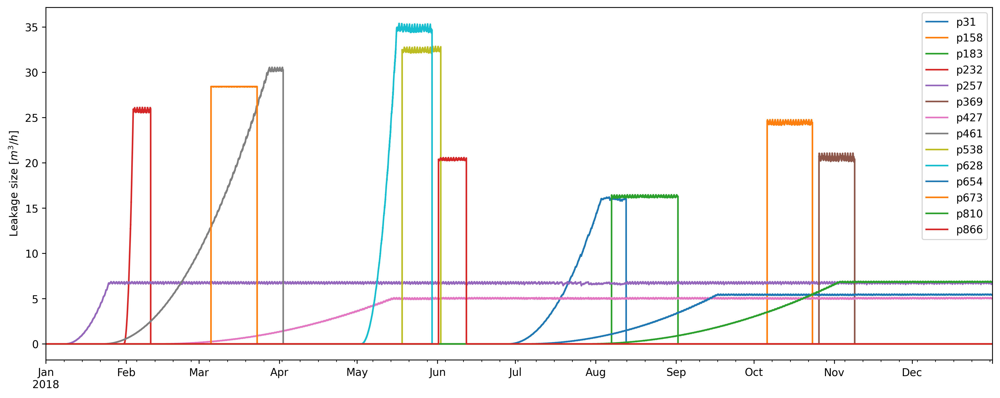

In [27]:
plt.figure(figsize=(16,6), dpi=300)
l18.plot(ax=plt.gca())
plt.legend(loc='upper right')
plt.ylabel('Leakage size [$m^3/h$]')
plt.show()

In [28]:
pipes = ['p158', 'p183', 'p232', 'p257', 'p369', 'p427', 'p461', 'p538',
       'p628', 'p654', 'p673', 'p810', 'p866']

In [18]:
import seaborn as sns

In [19]:
red = sns.color_palette()[3]
green = sns.color_palette()[2]

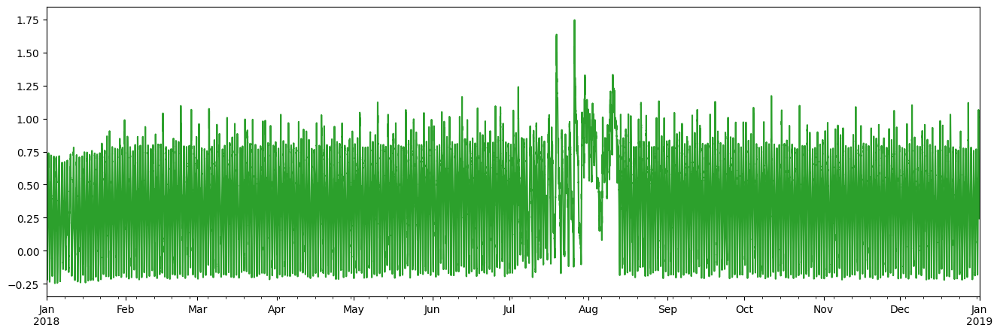

In [20]:
plt.figure(figsize=(16,5))   
((error_by_node['n1'])).plot(ax=plt.gca(),label='Residual signal, $r_{1}(k)$',color=green) # Plot the error of a single node with x10 scale
plt.show()                                                   # Display result

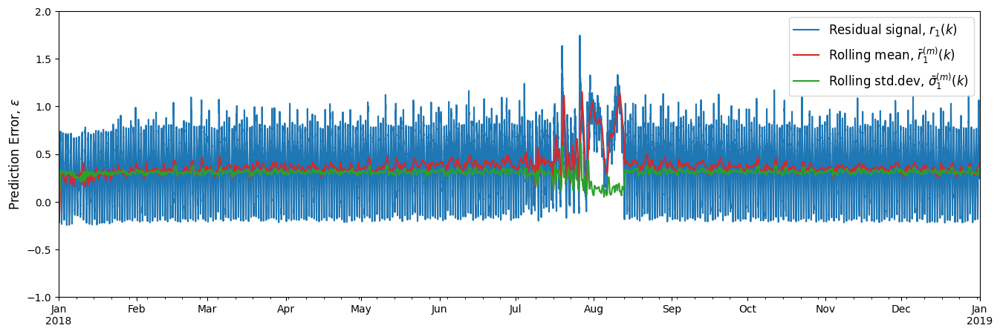

In [22]:
plt.figure(figsize=(16,5))                          # Set figure properties
plt.ylim(-1,2)
((error_by_node['n1'])).plot(ax=plt.gca(),label='Residual signal, $r_{1}(k)$') # Plot the error of a single node with x10 scale
((error_by_node['n1'])).rolling('1d').mean().plot(ax=plt.gca(),label=r'Rolling mean, $\bar{r}_{1}^{(m)}(k)$',color=red) # Plot the error of a single node with x10 scale
((error_by_node['n1'])).rolling('1d').std().plot(ax=plt.gca(),label=r'Rolling std.dev, $\bar{\sigma}_{1}^{(m)}(k)$',color=green) # Plot the error of a single node with x10 scale
plt.ylabel('Prediction Error, $\epsilon$', size=12)
plt.legend(loc='upper right', prop={'size': 12})
plt.show()                                                   # Display result

In [36]:
nodes = ['n1','n10','n20','n30','n40','n50']

In [37]:
nodes = ['n40','n42','n386','n380','n43','n45']

C:\Users\30806\AppData\Local\Temp\ipykernel_12876\4281277015.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(error_by_node[node], ax=axis, color=sns.color_palette()[i])
C:\Users\30806\AppData\Local\Temp\ipykernel_12876\4281277015.py:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(error_by_n

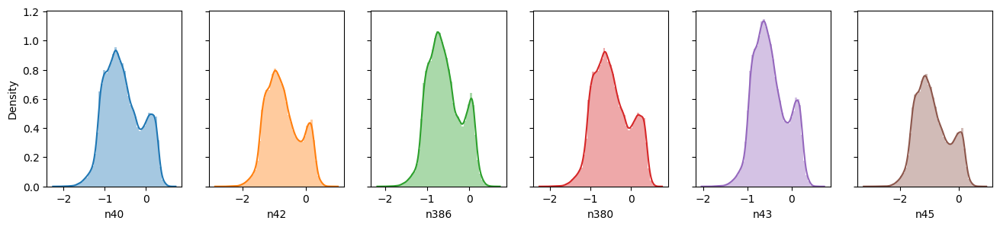

In [38]:
fig,ax = plt.subplots(ncols=len(nodes), figsize=(16,3), sharey=True)

for i,(node,axis) in enumerate(zip(nodes, ax.ravel())):
    sns.distplot(error_by_node[node], ax=axis, color=sns.color_palette()[i])

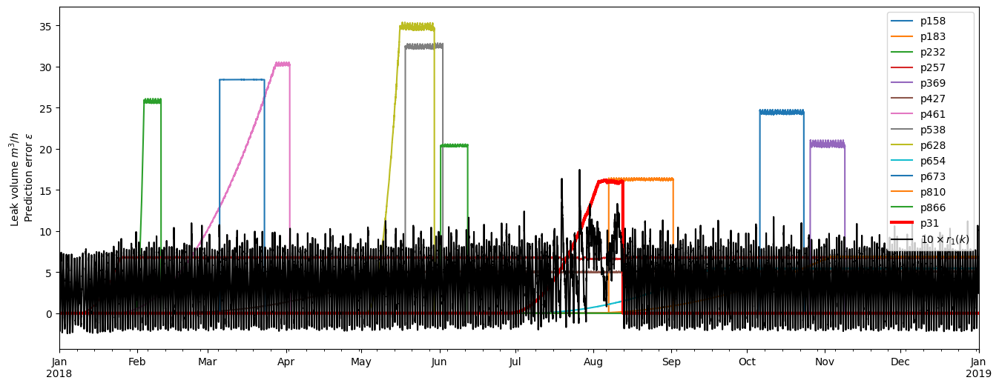

In [39]:
plt.figure(figsize=(16,6))                          # Set figure properties
l18[pipes].plot(ax=plt.gca())                                       # Plot the leakages in 2018
l18['p31'].plot(ax=plt.gca(), color='r', linewidth=3)
(10*(error_by_node['n1'])).plot(ax=plt.gca(),label=r'$10 \times r_1(k)$',color='k') # Plot the error of a single node with x10 scale
plt.ylabel('Leak volume $m^3/h$ \n Prediction error $\epsilon$')
plt.legend(loc='upper right')
plt.show()                                                   # Display result

Look how correlated the `p31` leakage is with the error signal for node 1:

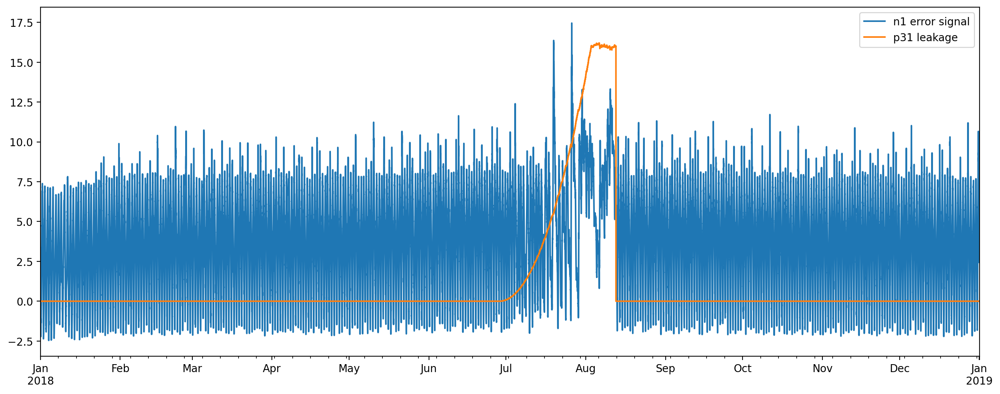

In [40]:
plt.figure(figsize=(16,6), dpi=200)                                  # Set figure properties
(10*error_by_node['n1']).plot(ax=plt.gca(),label='n1 error signal')  # Plot the error of a single node with x10 scale
l18['p31'].plot(ax=plt.gca(),label='p31 leakage')                    # Plot the leakages in 2018
plt.legend()
plt.show()                                                           # Display result

I bet they must be interdependant, i.e. be close to one another!

<img src="studies/figs/p31.png" alt="Drawing" style="height: 500px;"/>

... indeed they are, this is an isolated pressure zone of the network.<br>
Lets investigate the error signals closer to the leak source:

In [23]:
leak_3_hop_neighbours = ['n42', 'n40', 'n386', 'n380', 'n43', 'n28', 'n38', 'n45']

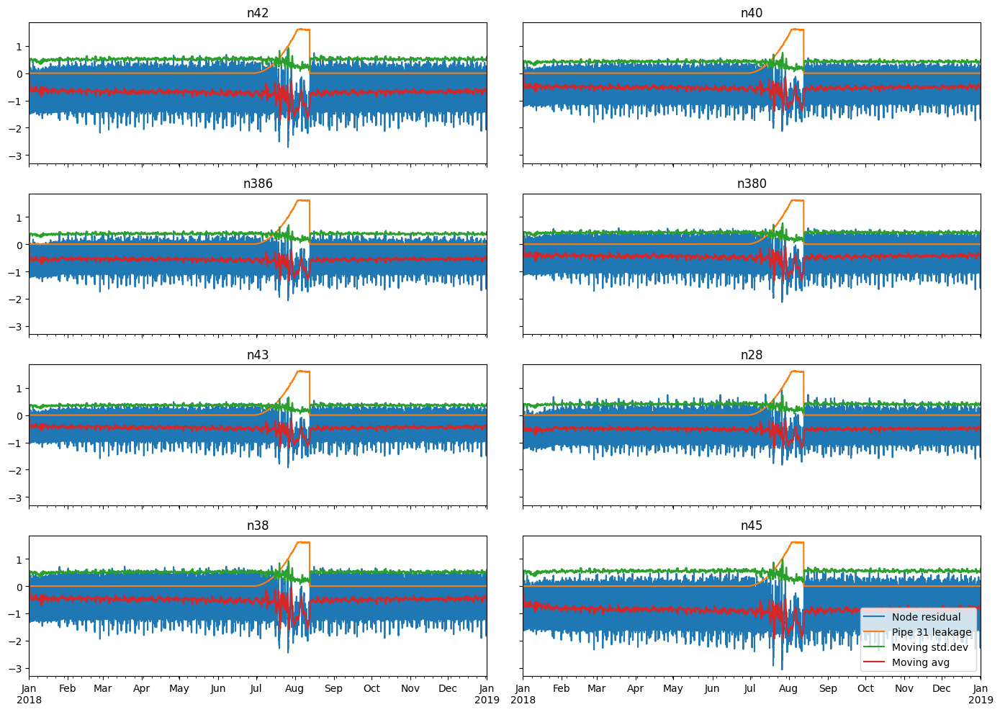

In [24]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(14,10), sharex=True, sharey=True)

# Plot the error of the three hop neighbours of the leaky pipes
for neighbour, axis in zip(leak_3_hop_neighbours, ax.ravel()):    
    (error_by_node[neighbour]).plot(ax=axis,label='Node residual')
    (0.1*l18['p31']).plot(ax=axis, label='Pipe 31 leakage')
    (error_by_node[neighbour].rolling('1d').std() ).plot(ax=axis,label='Moving std.dev')
    (error_by_node[neighbour].rolling('1d').mean()).plot(ax=axis,label='Moving avg')
    axis.set_title(neighbour)
    
#plt.suptitle('3-hop neighbour node error signals of the leakage in pipe 31')
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()                                      # Display result

In [44]:
pipe_2_hop_neighbours = ['p31','p315','p32','p305','p304','p33','p314','p273']

**Note!** <br>
I also added `p273` in there, just to visualise whether we'd see similar trends everywhere in the pressure zone

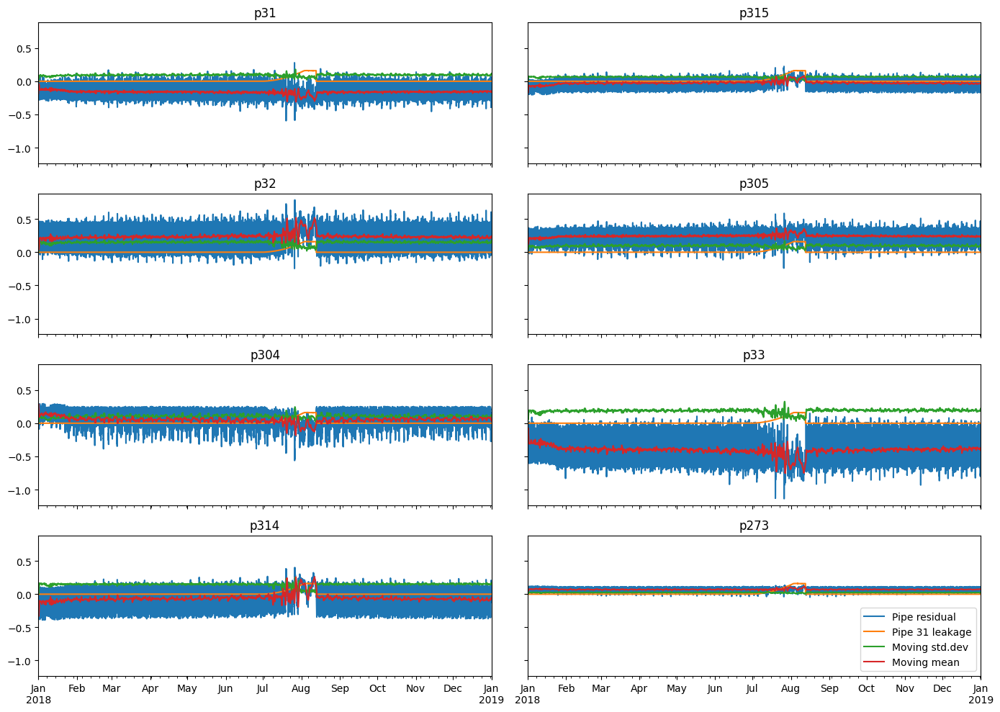

In [45]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(14,10), sharex=True, sharey=True)

# Plot the error of the three hop neighbours of the leaky pipes
for neighbour, axis in zip(pipe_2_hop_neighbours, ax.ravel()):    
    (error_by_pipe[neighbour]).plot(ax=axis,label='Pipe residual') # Plot pipe error
    (0.01*l18['p31']).plot(ax=axis, label='Pipe 31 leakage')                     # Plot leakage
    (error_by_pipe[neighbour].rolling('1d').std() ).plot(ax=axis,label='Moving std.dev')
    (error_by_pipe[neighbour].rolling('1d').mean()).plot(ax=axis,label='Moving mean')
    
    axis.set_title(neighbour)
plt.legend(loc='lower right')
plt.tight_layout()
plt.show()                                      # Display result

**Analysis** <br>
These are quite promising results, that deviation seems most prominent on `p31` where the leak is situated, and on its neighbour, `p314`. 
However this is not very noticable on `p253` happily for us as that node is very far away, albeit in the same pressure zone.

<a id='other'></a>
*Back to [Table of Contents](#toc)*

### 8.2 Other Leakages in the Network and their Corresponding "Pipe Signals"

So, let's try to plot all the leakages in the leakage database for 2018 against their corresponding "pipe signals", i.e. the reconstruction/prediction error difference of the two nodes connected by the pipes:

\begin{equation}
\epsilon_{p_i} = \Delta\epsilon_{n_i~,~n_j} = \epsilon_{n_i} - \epsilon_{n_j}
\end{equation}

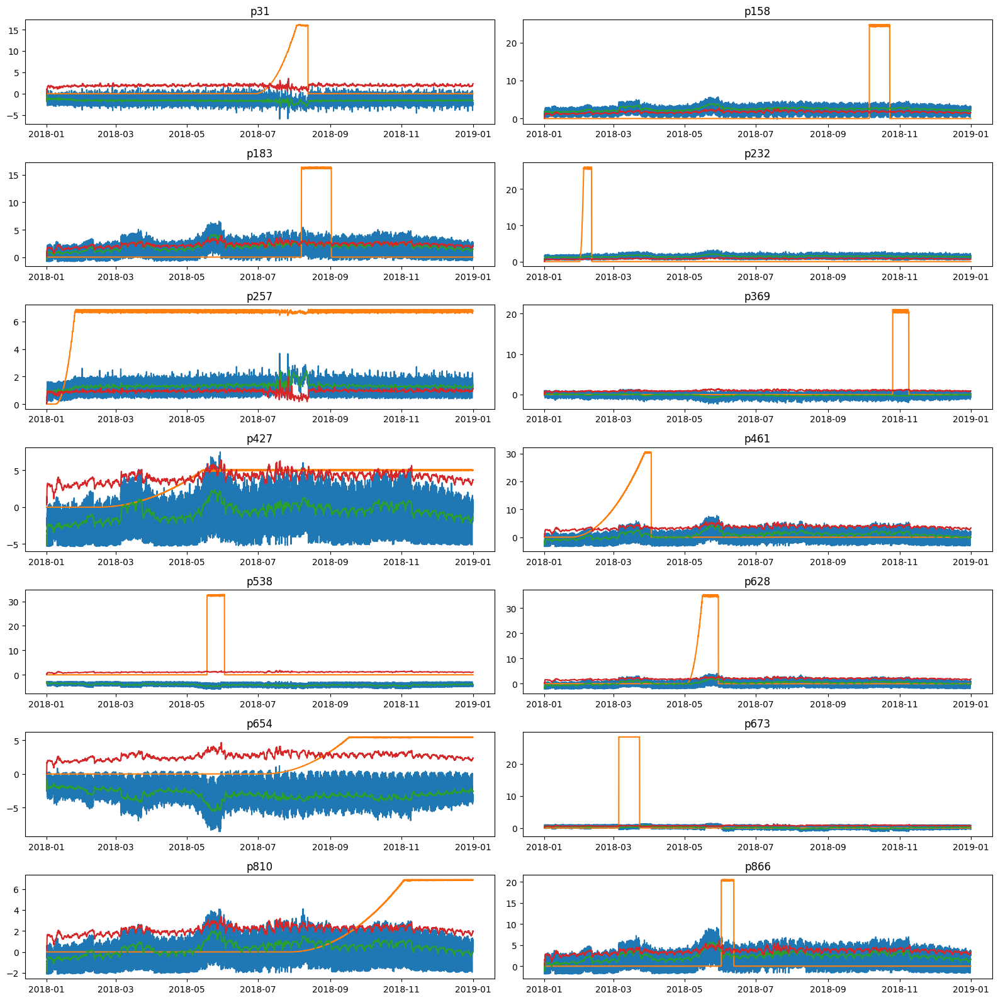

In [46]:
fig,ax = plt.subplots(nrows=7,ncols=2, figsize=(16,16),sharex=False)

for axis,pipe in zip(ax.ravel(),l18.columns):
    axis.plot(10 * error_by_pipe[pipe])
    axis.plot(l18[pipe])
    axis.plot(10*error_by_pipe[pipe].rolling('1d').mean())
    axis.plot(20*error_by_pipe[pipe].rolling('1d').std() )

    axis.set_title(pipe)

plt.tight_layout()
plt.show()

Okay, fair enough, they don't all pop out like the one at `p31`.<br>
But what if we look at the neighbours of some of those leaky pipes?

<a id='p158'></a>
*Back to [Table of Contents](#toc)*

### 8.3 Leakage @ `p158`

In [47]:
neighbors_by_pipe['p158']

[235, 232]

<img src="studies/figs/p158.png" alt="Drawing" style="height: 500px;"/>

In [48]:
pipe_1_hop_neighbours = ['p158','p156','p705','p714','p80','p53', # <-- 1-hop neighbours
                         'p426','p888']                           # <-- 426 and 888 are far away!

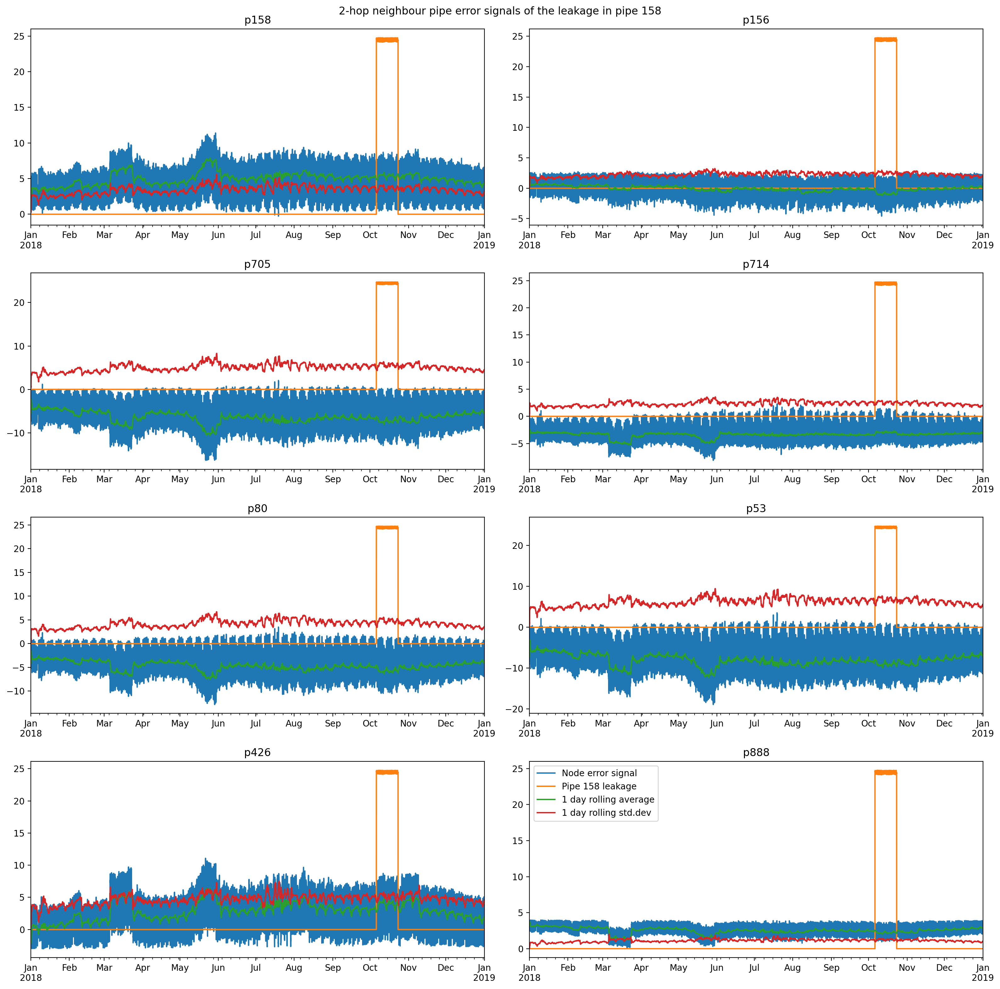

In [49]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16,16), dpi=200)

# Plot the error of the three hop neighbours of the leaky pipes
for neighbour, axis in zip(pipe_1_hop_neighbours, ax.ravel()):    
    (20*error_by_pipe[neighbour]).plot(ax=axis,label='Node error signal') # Plot pipe error
    l18['p158'].plot(ax=axis, label='Pipe 158 leakage')                     # Plot leakage
    (20*error_by_pipe[neighbour].rolling('1d').mean()).plot(ax=axis,label='1 day rolling average')
    (40*error_by_pipe[neighbour].rolling('1d').std() ).plot(ax=axis,label='1 day rolling std.dev')
    
    axis.set_title(neighbour)
    
plt.suptitle('2-hop neighbour pipe error signals of the leakage in pipe 158')
plt.legend()
plt.tight_layout()
plt.show()                                     

<a id='p183'></a>
*Back to [Table of Contents](#toc)*

### 8.4 Leakage @ `p183`

In [31]:
neighbors_by_pipe['p183']

[305, 299]

<img src="studies/figs/p183.png" alt="Drawing" style="height: 500px;"/>

In [32]:
pipe_1_hop_neighbours = ['p183','p185','p856','p842','p830', # <-- 1-hop neighbours
                         'p857',                             # <-- 2-hop neighbours
                         'p738','p694']                      # <-- 426 and 888 are far away!

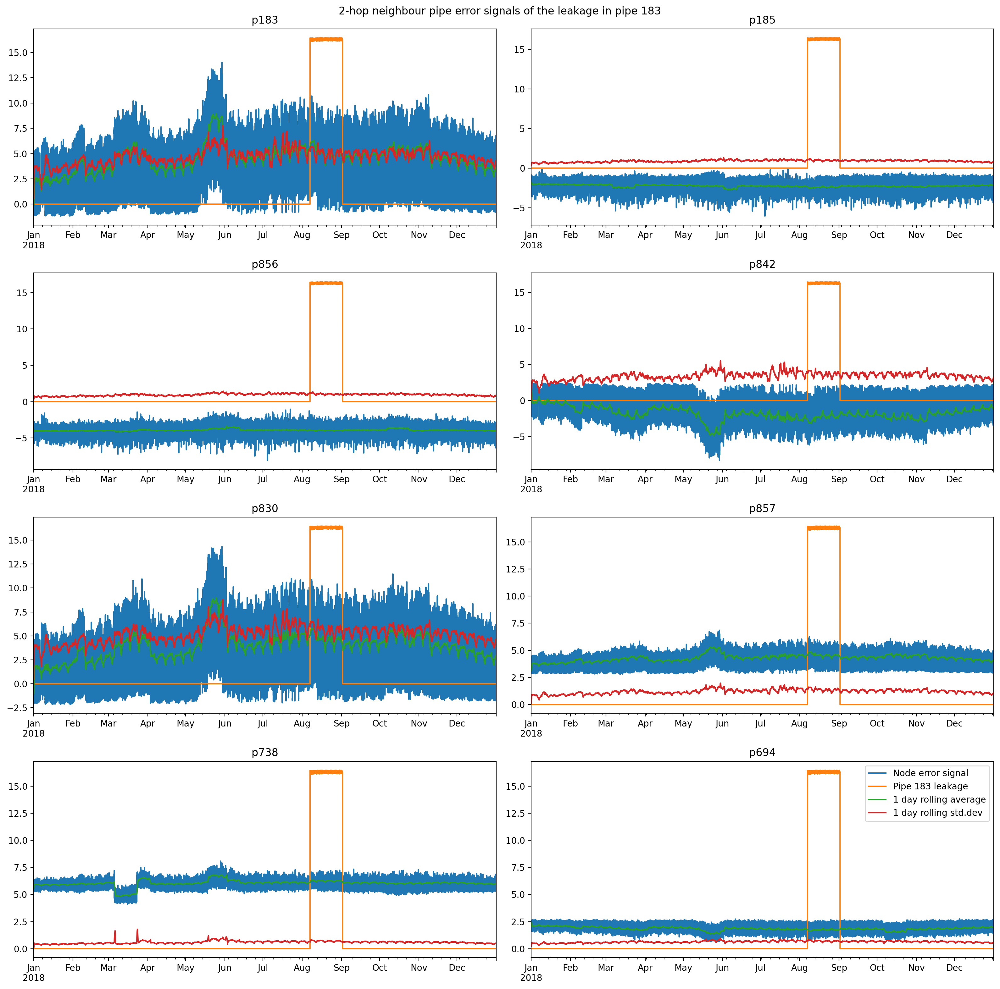

In [33]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16,16), dpi=200)

# Plot the error of the three hop neighbours of the leaky pipes
for neighbour, axis in zip(pipe_1_hop_neighbours, ax.ravel()):    
    (20*error_by_pipe[neighbour]).plot(ax=axis,label='Node error signal') # Plot pipe error
    l18['p183'].plot(ax=axis, label='Pipe 183 leakage')                     # Plot leakage
    (20*error_by_pipe[neighbour].rolling('1d').mean()).plot(ax=axis,label='1 day rolling average')
    (40*error_by_pipe[neighbour].rolling('1d').std() ).plot(ax=axis,label='1 day rolling std.dev')
    
    axis.set_title(neighbour)
    
plt.suptitle('2-hop neighbour pipe error signals of the leakage in pipe 183')
plt.legend()
plt.tight_layout()
plt.show()                                     

<a id='p232'></a>
*Back to [Table of Contents](#toc)*

### 8.5 Leakage @ `p232`

In [50]:
neighbors_by_pipe['p232']

[191, 184]

<img src="studies/figs/p232.png" alt="Drawing" style="height: 500px;"/>

In [51]:
pipe_1_hop_neighbours = ['p232','p617','p621','p431','p611','p609', # <-- 1-hop neighbours
                         #'p857',                             # <-- 2-hop neighbours
                         'p509','p437']                      # <-- 426 and 888 are far away!

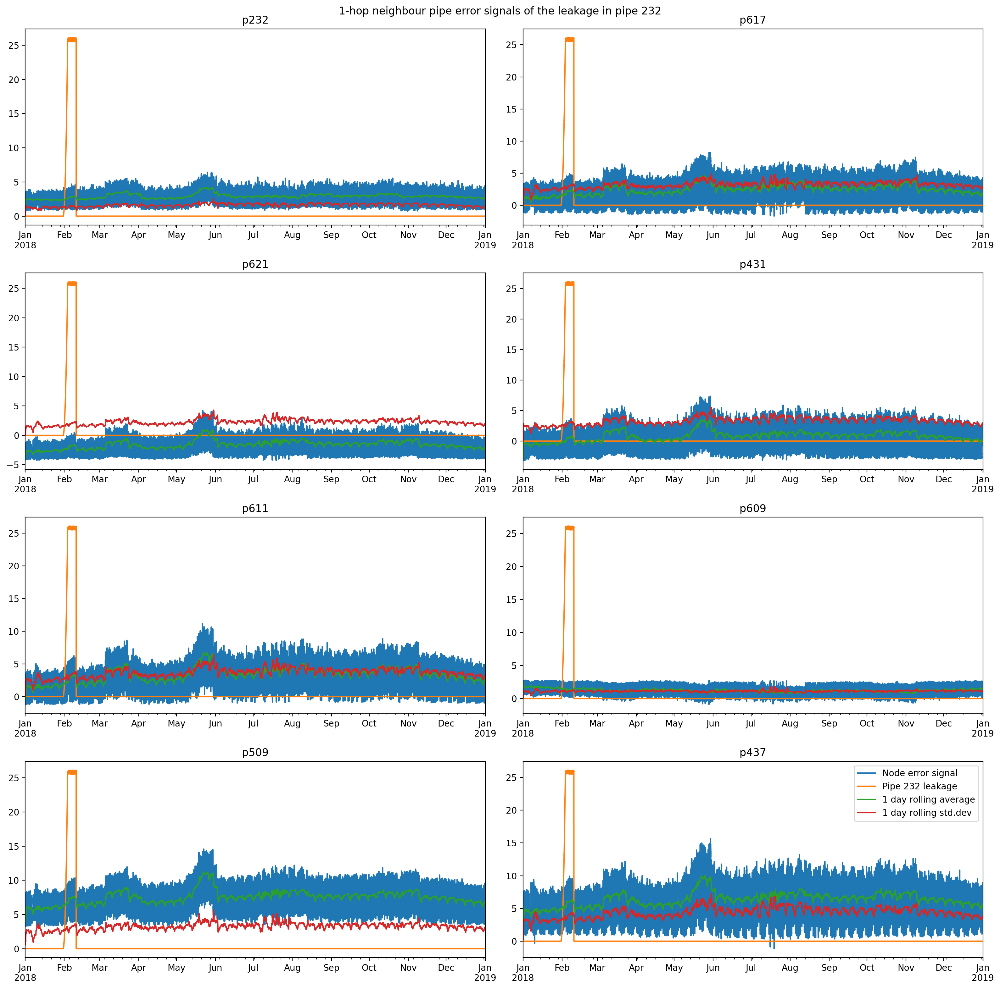

In [52]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16,16), dpi=200)

# Plot the error of the three hop neighbours of the leaky pipes
for neighbour, axis in zip(pipe_1_hop_neighbours, ax.ravel()):    
    (20*error_by_pipe[neighbour]).plot(ax=axis,label='Node error signal') # Plot pipe error
    l18['p232'].plot(ax=axis, label='Pipe 232 leakage')                     # Plot leakage
    (20*error_by_pipe[neighbour].rolling('1d').mean()).plot(ax=axis,label='1 day rolling average')
    (40*error_by_pipe[neighbour].rolling('1d').std() ).plot(ax=axis,label='1 day rolling std.dev')
    
    axis.set_title(neighbour)
    
plt.suptitle('1-hop neighbour pipe error signals of the leakage in pipe 232')
plt.legend()
plt.tight_layout()
plt.show()                                     

<a id='p257'></a>
*Back to [Table of Contents](#toc)*

### 8.6 Leakage @ `p257`

In [53]:
neighbors_by_pipe['p257']

[351, 350]

<img src="studies/figs/p257.png" alt="Drawing" style="height: 500px;"/>

In [54]:
pipe_neighbours = ['p257','p258','p256','p255','p11','p254','p269', # <-- 1-3-hop neighbours
                   'p31'] # <-- Far away


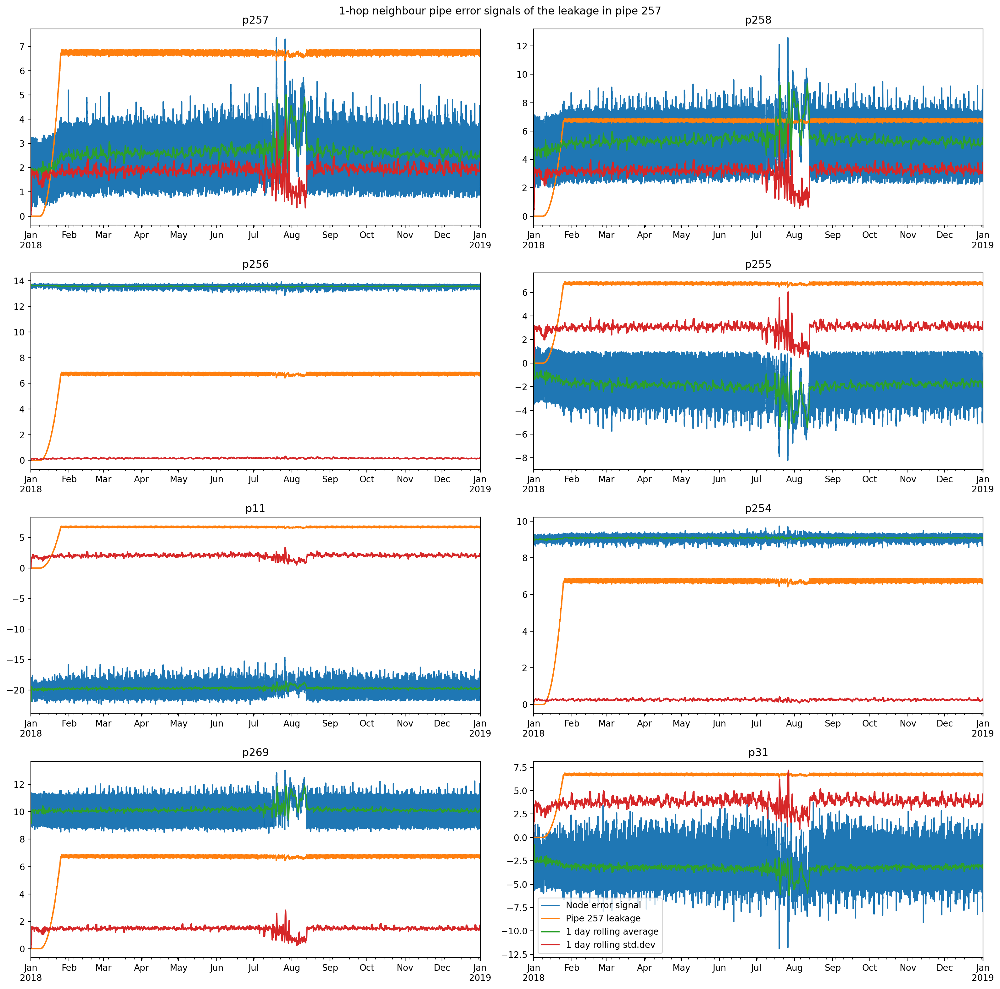

In [55]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16,16), dpi=200)

# Plot the error of the three hop neighbours of the leaky pipes
for neighbour, axis in zip(pipe_neighbours, ax.ravel()):    
    (20*error_by_pipe[neighbour]).plot(ax=axis,label='Node error signal') # Plot pipe error
    l18['p257'].plot(ax=axis, label='Pipe 257 leakage')                     # Plot leakage
    (20*error_by_pipe[neighbour].rolling('1d').mean()).plot(ax=axis,label='1 day rolling average')
    (40*error_by_pipe[neighbour].rolling('1d').std() ).plot(ax=axis,label='1 day rolling std.dev')
    
    axis.set_title(neighbour)
    
plt.suptitle('1-hop neighbour pipe error signals of the leakage in pipe 257')
plt.legend()
plt.tight_layout()
plt.show()                                     

<a id='p369'></a>
*Back to [Table of Contents](#toc)*

### 8.7 Leakage @ `p369`

In [56]:
neighbors_by_pipe['p369']

[423, 422]

<img src="studies/figs/p369.png" alt="Drawing" style="height: 500px;"/>

In [57]:
pipe_neighbours = ['p369','p368','p370','p367','p371','p366','p392', # <-- 1-3-hop neighbours
                   'p345'] # <-- Far away


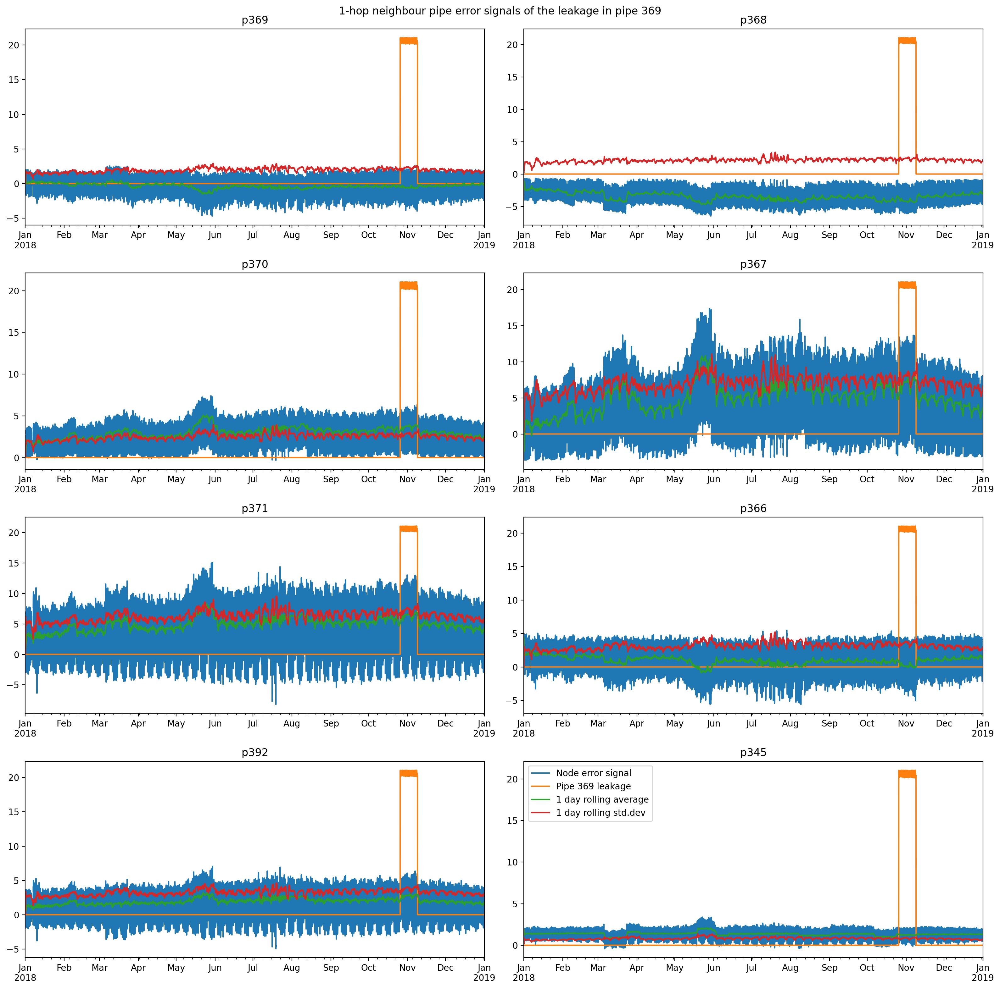

In [58]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16,16), dpi=200)

# Plot the error of the three hop neighbours of the leaky pipes
for neighbour, axis in zip(pipe_neighbours, ax.ravel()):    
    (20*error_by_pipe[neighbour]).plot(ax=axis,label='Node error signal') # Plot pipe error
    l18['p369'].plot(ax=axis, label='Pipe 369 leakage')                     # Plot leakage
    (20*error_by_pipe[neighbour].rolling('1d').mean()).plot(ax=axis,label='1 day rolling average')
    (40*error_by_pipe[neighbour].rolling('1d').std() ).plot(ax=axis,label='1 day rolling std.dev')
    
    axis.set_title(neighbour)
    
plt.suptitle('1-hop neighbour pipe error signals of the leakage in pipe 369')
plt.legend()
plt.tight_layout()
plt.show()                                     

<a id='p427'></a>
*Back to [Table of Contents](#toc)*

### 8.8 Leakage @ `p427`

In [59]:
neighbors_by_pipe['p427']

[462, 340]

<img src="studies/figs/p427.png" alt="Drawing" style="height: 500px;"/>

In [60]:
pipe_neighbours = ['p427','p894','p426','p893','p425','p685','p3', # <-- 1-3-hop neighbours
                   'p584'] # <-- Far away


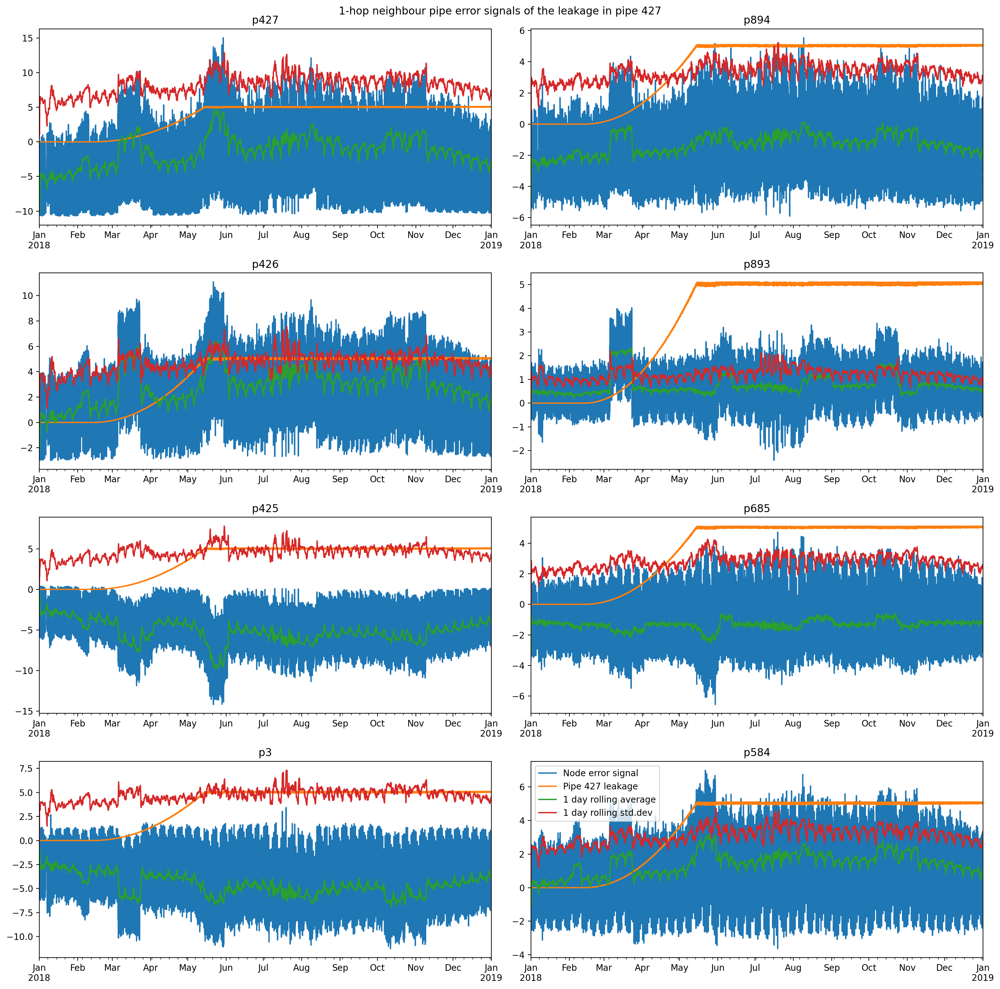

In [61]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16,16), dpi=200)

# Plot the error of the three hop neighbours of the leaky pipes
for neighbour, axis in zip(pipe_neighbours, ax.ravel()):    
    (20*error_by_pipe[neighbour]).plot(ax=axis,label='Node error signal') # Plot pipe error
    l18['p427'].plot(ax=axis, label='Pipe 427 leakage')                     # Plot leakage
    (20*error_by_pipe[neighbour].rolling('1d').mean()).plot(ax=axis,label='1 day rolling average')
    (40*error_by_pipe[neighbour].rolling('1d').std() ).plot(ax=axis,label='1 day rolling std.dev')
    
    axis.set_title(neighbour)
    
plt.suptitle('1-hop neighbour pipe error signals of the leakage in pipe 427')
plt.legend()
plt.tight_layout()
plt.show()                                     

<a id='p461'></a>
*Back to [Table of Contents](#toc)*

### 8.9 Leakage @ `p461`

In [46]:
neighbors_by_pipe['p461']

[484, 106]

<img src="studies/figs/p461.png" alt="Drawing" style="height: 750px;"/>

In [47]:
pipeByNeighborLookup(114, 116, pipe_by_neighbors)

'p108'

In [48]:
pipe_neighbours = ['p461','p99','p462','p97','p463','p100','p108', # <-- 1-3-hop neighbours
                   'p615'] # <-- Far away


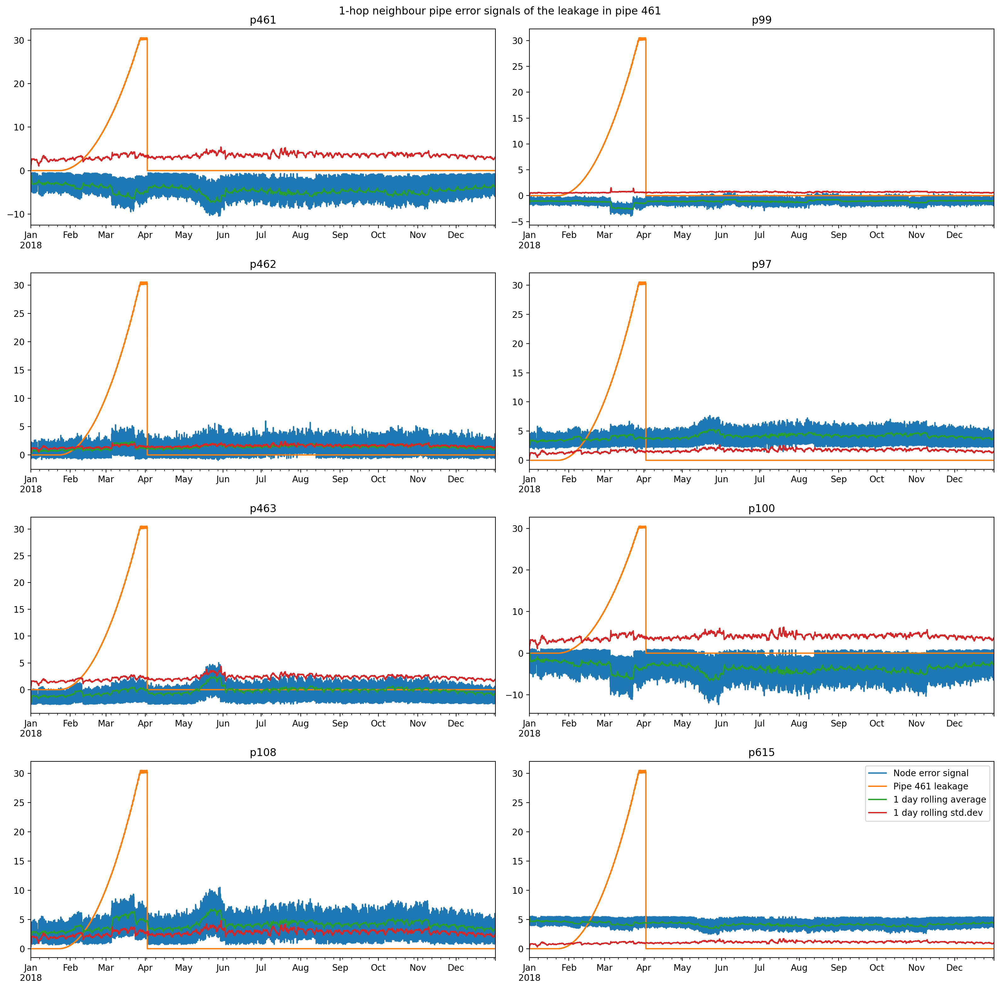

In [49]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16,16), dpi=200)

# Plot the error of the three hop neighbours of the leaky pipes
for neighbour, axis in zip(pipe_neighbours, ax.ravel()):    
    (20*error_by_pipe[neighbour]).plot(ax=axis,label='Node error signal') # Plot pipe error
    l18['p461'].plot(ax=axis, label='Pipe 461 leakage')                     # Plot leakage
    (20*error_by_pipe[neighbour].rolling('1d').mean()).plot(ax=axis,label='1 day rolling average')
    (40*error_by_pipe[neighbour].rolling('1d').std() ).plot(ax=axis,label='1 day rolling std.dev')
    
    axis.set_title(neighbour)
    
plt.suptitle('1-hop neighbour pipe error signals of the leakage in pipe 461')
plt.legend()
plt.tight_layout()
plt.show()                                     

<a id='p538'></a>
*Back to [Table of Contents](#toc)*

### 8.10 Leakage @ `p538`

In [50]:
neighbors_by_pipe['p538']

[531, 147]

<img src="studies/figs/p538.png" alt="Drawing" style="height: 750px;"/>

In [51]:
pipeByNeighborLookup(114, 116, pipe_by_neighbors)

'p108'

In [52]:
pipe_neighbours = ['p538','p121','p537','p114','p122','p199','p491', # <-- 1-3-hop neighbours
                   'p127'] # <-- Far away


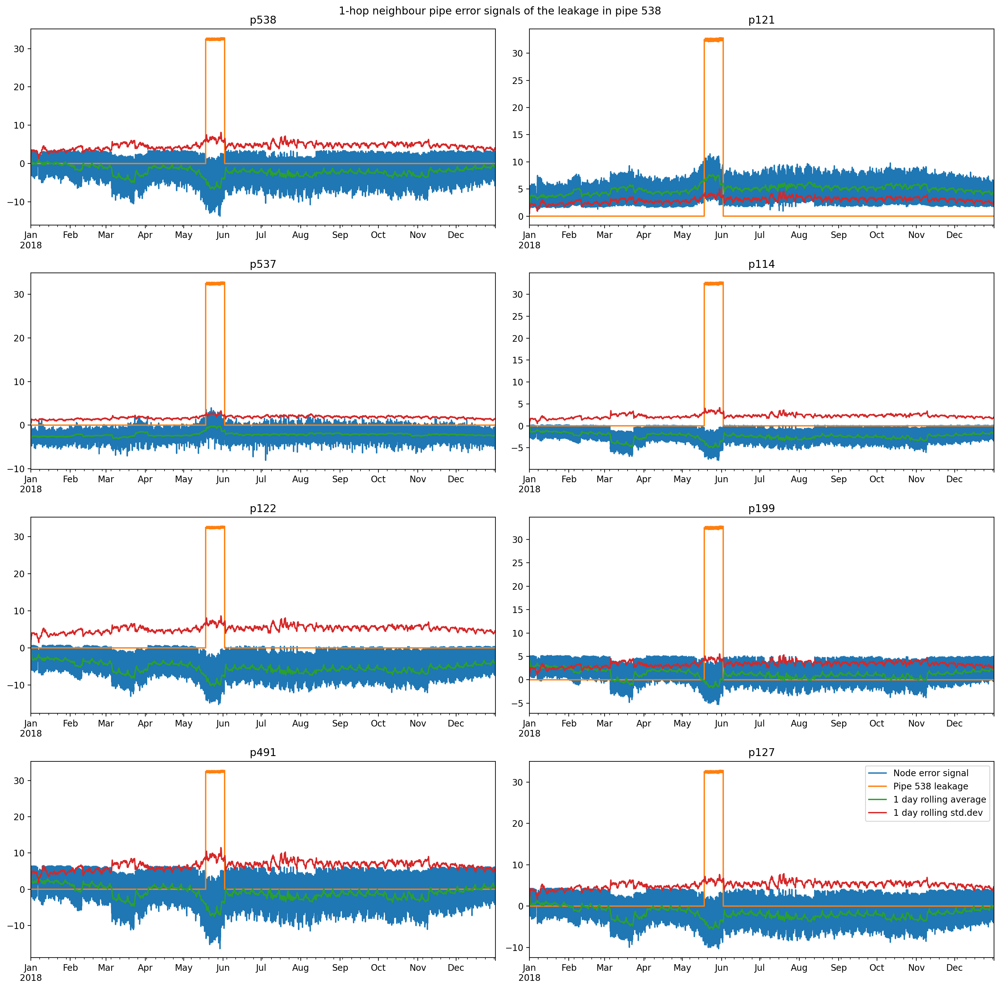

In [53]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16,16), dpi=200)

# Plot the error of the three hop neighbours of the leaky pipes
for neighbour, axis in zip(pipe_neighbours, ax.ravel()):    
    (20*error_by_pipe[neighbour]).plot(ax=axis,label='Node error signal') # Plot pipe error
    l18['p538'].plot(ax=axis, label='Pipe 538 leakage')                     # Plot leakage
    (20*error_by_pipe[neighbour].rolling('1d').mean()).plot(ax=axis,label='1 day rolling average')
    (40*error_by_pipe[neighbour].rolling('1d').std() ).plot(ax=axis,label='1 day rolling std.dev')
    
    axis.set_title(neighbour)
    
plt.suptitle('1-hop neighbour pipe error signals of the leakage in pipe 538')
plt.legend()
plt.tight_layout()
plt.show()                                     

<a id='p628'></a>
*Back to [Table of Contents](#toc)*

### 8.11 Leakage @ `p628`

In [54]:
neighbors_by_pipe['p628']

[590, 197]

<img src="studies/figs/p628.png" alt="Drawing" style="height: 500px;"/>

In [55]:
pipe_neighbours = ['p628','p627','p630','p143','p626','p629','p652', # <-- 1-3-hop neighbours
                   'p196'] # <-- Far away


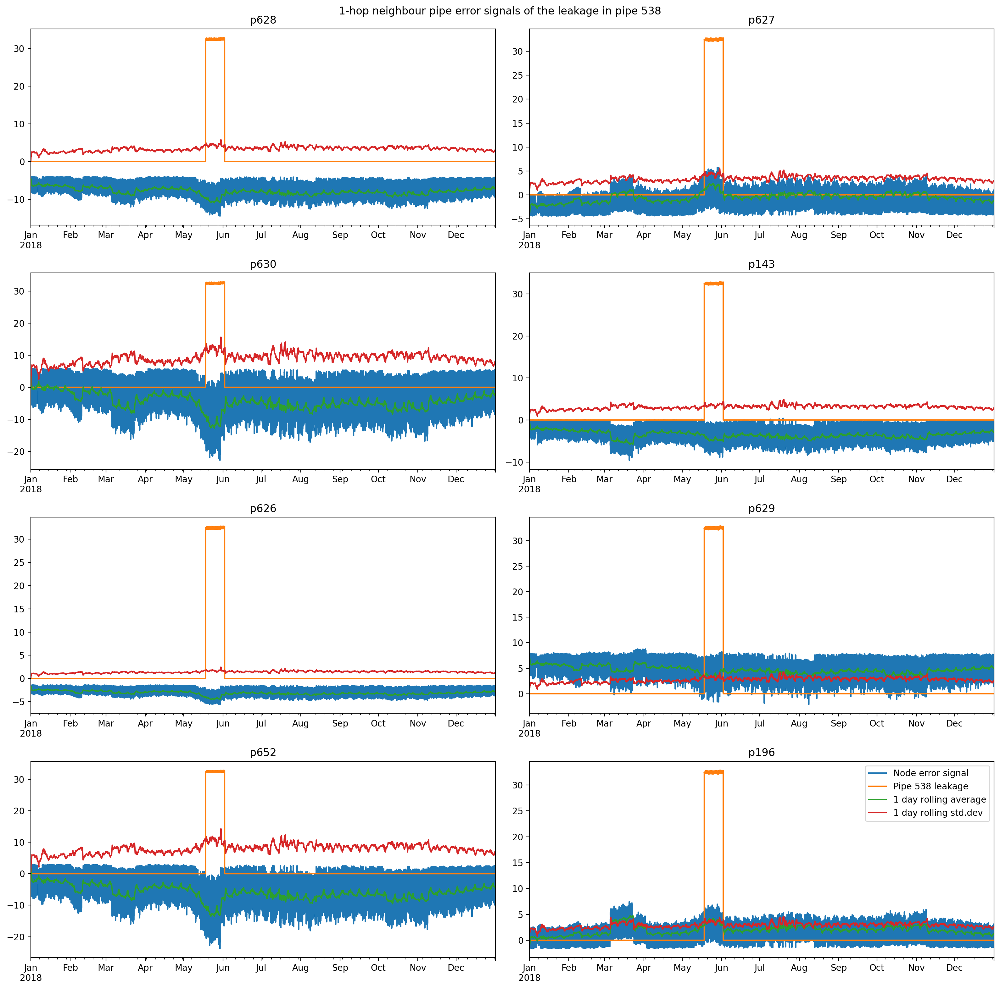

In [56]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16,16), dpi=200)

# Plot the error of the three hop neighbours of the leaky pipes
for neighbour, axis in zip(pipe_neighbours, ax.ravel()):    
    (20*error_by_pipe[neighbour]).plot(ax=axis,label='Node error signal') # Plot pipe error
    l18['p538'].plot(ax=axis, label='Pipe 538 leakage')                     # Plot leakage
    (20*error_by_pipe[neighbour].rolling('1d').mean()).plot(ax=axis,label='1 day rolling average')
    (40*error_by_pipe[neighbour].rolling('1d').std() ).plot(ax=axis,label='1 day rolling std.dev')
    
    axis.set_title(neighbour)
    
plt.suptitle('1-hop neighbour pipe error signals of the leakage in pipe 538')
plt.legend()
plt.tight_layout()
plt.show()                                     

<a id='p654'></a>
*Back to [Table of Contents](#toc)*

### 8.12 Leakage @ `p654`

In [57]:
neighbors_by_pipe['p654']

[610, 609]

<img src="studies/figs/p654.png" alt="Drawing" style="height: 500px;"/>

In [58]:
pipe_neighbours = ['p654','p655','p653','p656','p652','p657','p143', # <-- 1-3-hop neighbours
                   'p440'] # <-- Far away


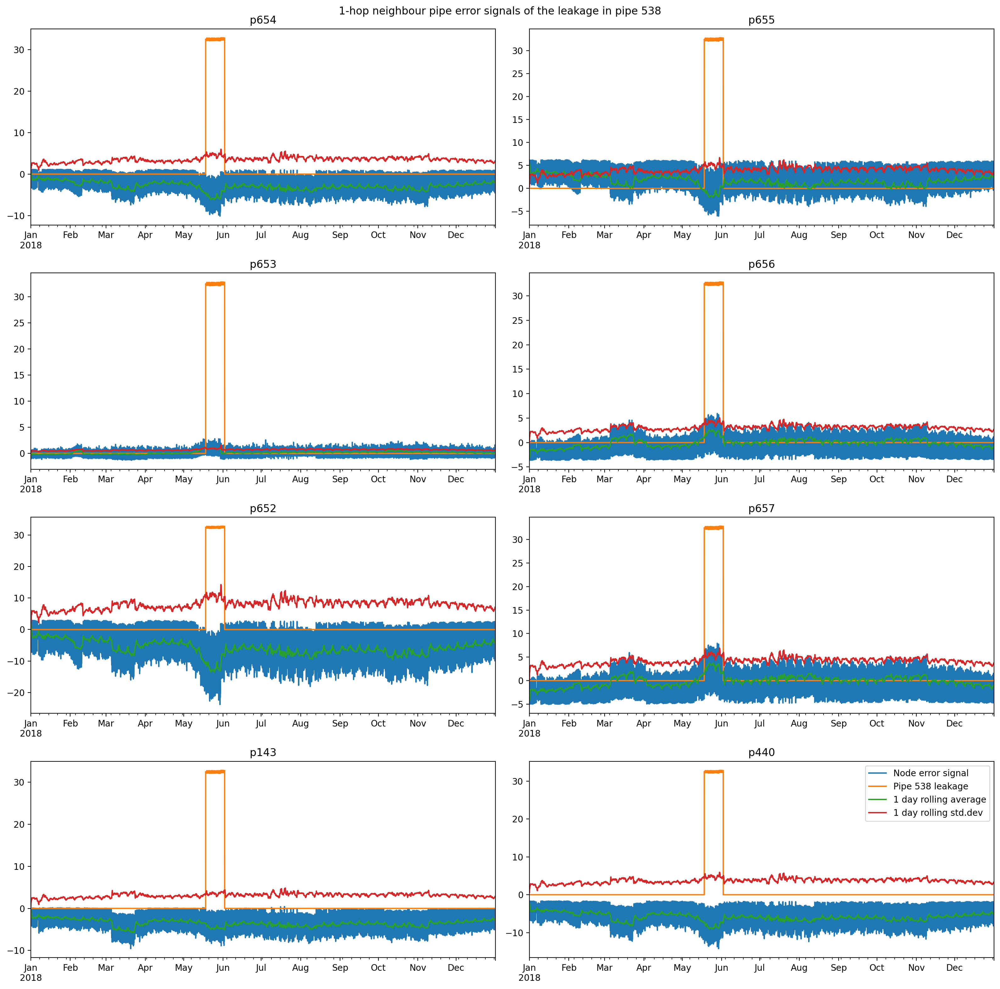

In [59]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16,16), dpi=200)

# Plot the error of the three hop neighbours of the leaky pipes
for neighbour, axis in zip(pipe_neighbours, ax.ravel()):    
    (20*error_by_pipe[neighbour]).plot(ax=axis,label='Node error signal') # Plot pipe error
    l18['p538'].plot(ax=axis, label='Pipe 538 leakage')                     # Plot leakage
    (20*error_by_pipe[neighbour].rolling('1d').mean()).plot(ax=axis,label='1 day rolling average')
    (40*error_by_pipe[neighbour].rolling('1d').std() ).plot(ax=axis,label='1 day rolling std.dev')
    
    axis.set_title(neighbour)
    
plt.suptitle('1-hop neighbour pipe error signals of the leakage in pipe 538')
plt.legend()
plt.tight_layout()
plt.show()                                     

<a id='p673'></a>
*Back to [Table of Contents](#toc)*

### 8.13 Leakage @ `p673`

In [60]:
neighbors_by_pipe['p673']

[623, 206]

<img src="studies/figs/p673.png" alt="Drawing" style="height: 500px;"/>

In [61]:
pipeByNeighborLookup(226, 227, pipe_by_neighbors)

'p155'

In [62]:
pipeByNeighborLookup(208, 209, pipe_by_neighbors)

'p207'

The `PUMP_1` edge name in the above is apparently wrong as per:

In [63]:
pipeByNeighborLookup(226, 229, pipe_by_neighbors)

'PRV-3'

In [64]:
pipe_neighbours = ['p673','p674','p145','PRV-3','p146','p155','p207', # <-- 1-3-hop neighbours
                   'p517'] # <-- Far away


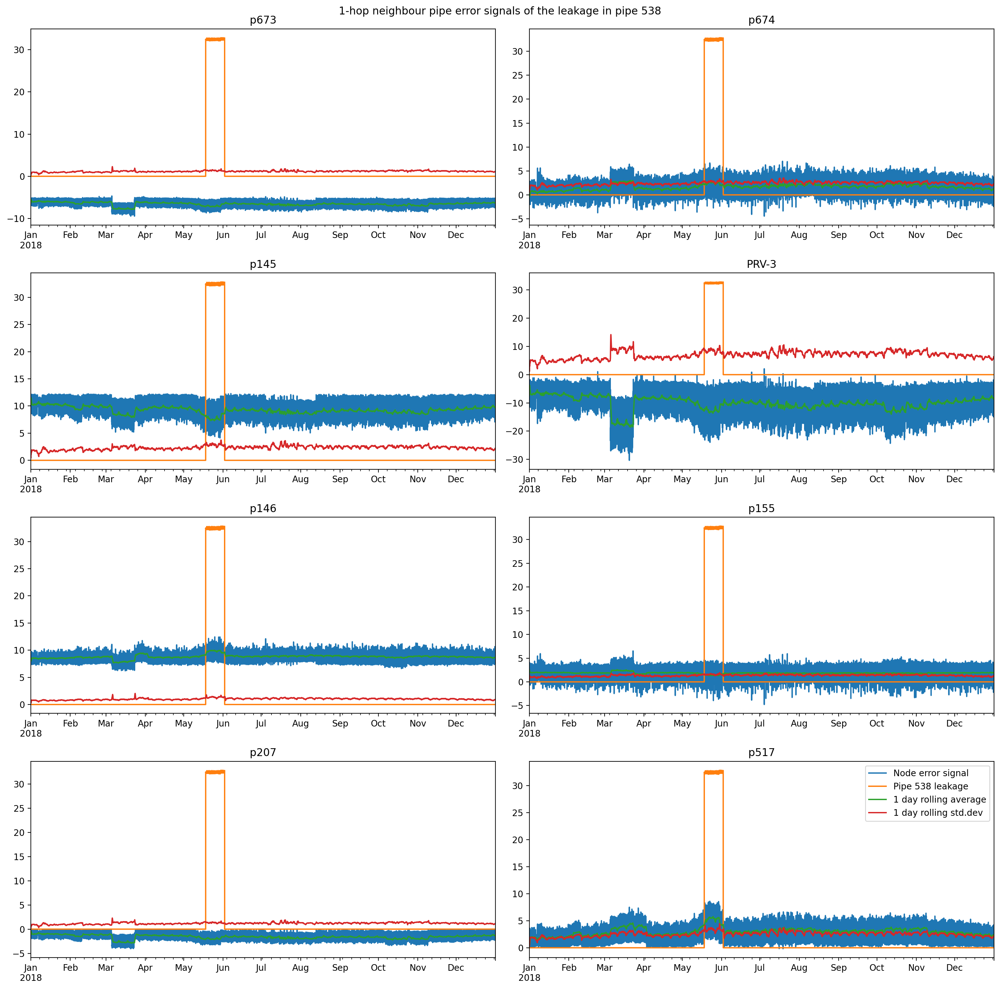

In [65]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16,16), dpi=200)

# Plot the error of the three hop neighbours of the leaky pipes
for neighbour, axis in zip(pipe_neighbours, ax.ravel()):    
    (20*error_by_pipe[neighbour]).plot(ax=axis,label='Node error signal') # Plot pipe error
    l18['p538'].plot(ax=axis, label='Pipe 538 leakage')                     # Plot leakage
    (20*error_by_pipe[neighbour].rolling('1d').mean()).plot(ax=axis,label='1 day rolling average')
    (40*error_by_pipe[neighbour].rolling('1d').std() ).plot(ax=axis,label='1 day rolling std.dev')
    
    axis.set_title(neighbour)
    
plt.suptitle('1-hop neighbour pipe error signals of the leakage in pipe 538')
plt.legend()
plt.tight_layout()
plt.show()                                     

<a id='p810'></a>
*Back to [Table of Contents](#toc)*

### 8.14 Leakage @ `p810`

In [66]:
neighbors_by_pipe['p810']

[717, 716]

<img src="studies/figs/p810.png" alt="Drawing" style="height: 500px;"/>

In [67]:
pipe_neighbours = ['p810','p809','p811','p808','p871','p807','p871', # <-- 1-3-hop neighbours
                   'p691'] # <-- Far away


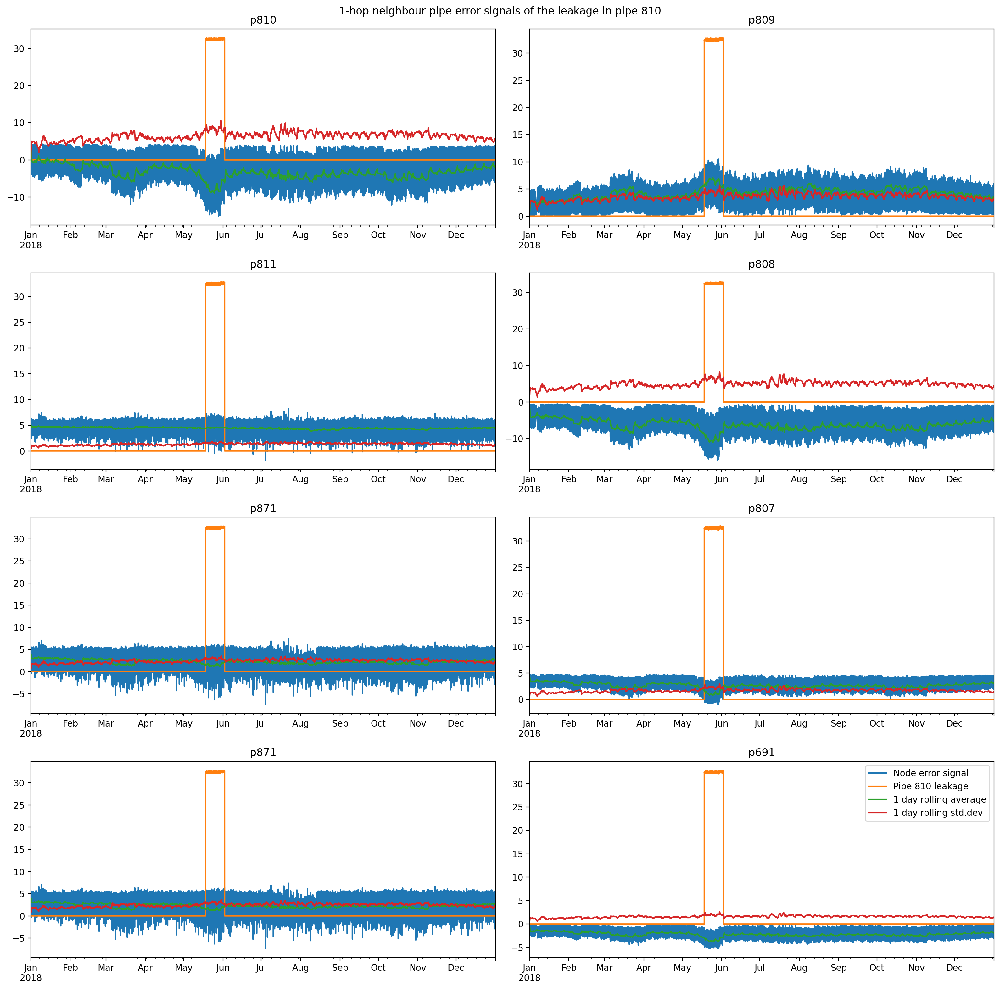

In [68]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16,16), dpi=200)

# Plot the error of the three hop neighbours of the leaky pipes
for neighbour, axis in zip(pipe_neighbours, ax.ravel()):    
    (20*error_by_pipe[neighbour]).plot(ax=axis,label='Node error signal') # Plot pipe error
    l18['p538'].plot(ax=axis, label='Pipe 810 leakage')                     # Plot leakage
    (20*error_by_pipe[neighbour].rolling('1d').mean()).plot(ax=axis,label='1 day rolling average')
    (40*error_by_pipe[neighbour].rolling('1d').std() ).plot(ax=axis,label='1 day rolling std.dev')
    
    axis.set_title(neighbour)
    
plt.suptitle('1-hop neighbour pipe error signals of the leakage in pipe 810')
plt.legend()
plt.tight_layout()
plt.show()                                     

<a id='p866'></a>
*Back to [Table of Contents](#toc)*

### 8.15 Leakage @ `p866`

In [69]:
neighbors_by_pipe['p866']

[758, 311]

<img src="studies/figs/p866.png" alt="Drawing" style="height: 500px;"/>

In [70]:
pipeByNeighborLookup(314, 316, pipe_by_neighbors)

'p69'

In [71]:
pipe_neighbours = ['p866','p865','p805','p186','p216','p804','p69', # <-- 1-3-hop neighbours
                   'p718'] # <-- Far away


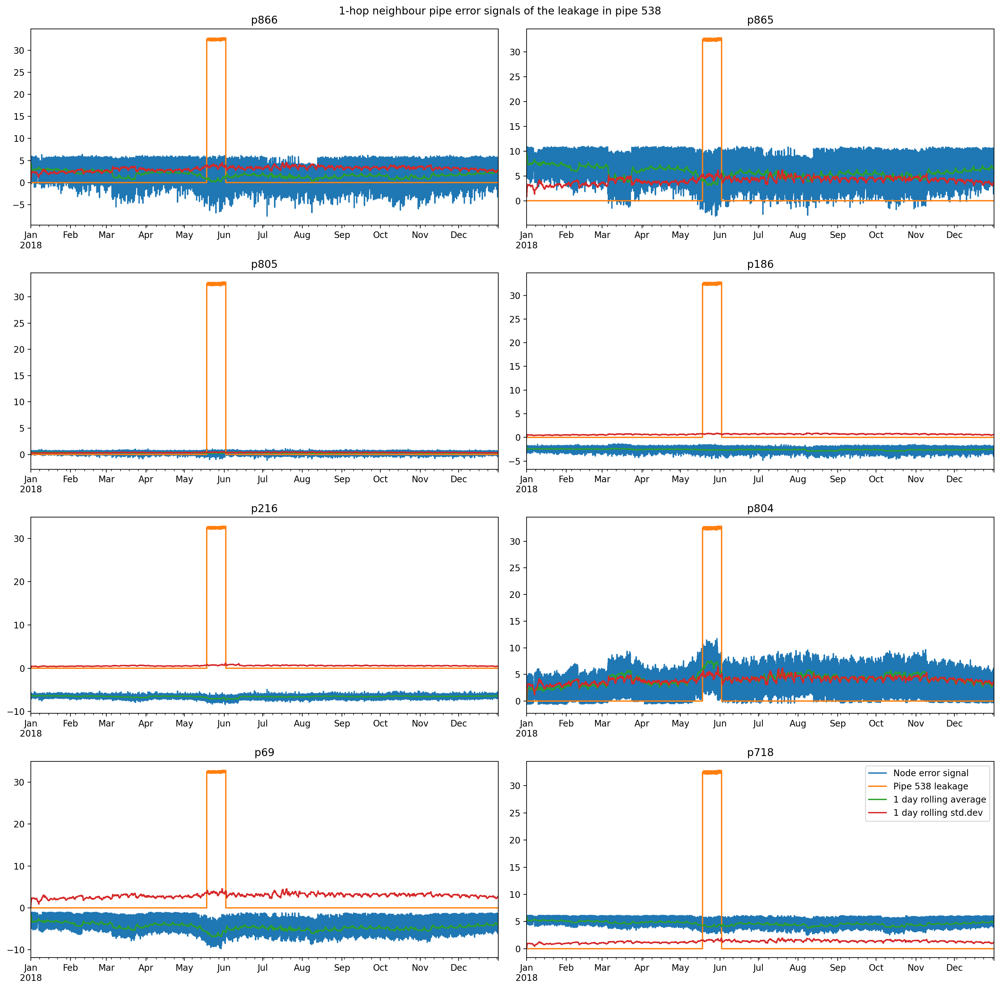

In [72]:
fig, ax = plt.subplots(nrows=4, ncols=2, figsize=(16,16), dpi=200)

# Plot the error of the three hop neighbours of the leaky pipes
for neighbour, axis in zip(pipe_neighbours, ax.ravel()):    
    (20*error_by_pipe[neighbour]).plot(ax=axis,label='Node error signal') # Plot pipe error
    l18['p538'].plot(ax=axis, label='Pipe 538 leakage')                     # Plot leakage
    (20*error_by_pipe[neighbour].rolling('1d').mean()).plot(ax=axis,label='1 day rolling average')
    (40*error_by_pipe[neighbour].rolling('1d').std() ).plot(ax=axis,label='1 day rolling std.dev')
    
    axis.set_title(neighbour)
    
plt.suptitle('1-hop neighbour pipe error signals of the leakage in pipe 538')
plt.legend()
plt.tight_layout()
plt.show()                                     